# Square-Octagon lattice

In [15]:
include("../functions.jl")
include("../plotting_functions.jl")
using LaTeXStrings
using JLD
using DataStructures
using LinearAlgebra
using Statistics
import Random
using ProgressMeter

In [16]:
# N used for data sent to Laura was N = 10.
# "so" stands for square octagon
# Generate lattice and spin lattice

# N = 85 has 19,996 vertices. This is used for the cluster and for the paper.

N = 20

@time so_lat_rect_full = get_so_lat_rect(N, oct, paper=true) 
@time so_lat_rect_spin_full, latA, latB, sub_lat, G_to_spin, spin_to_G = get_so_lat_spin(so_lat_rect_full)


  0.342268 seconds (135.96 k allocations: 116.615 MiB, 38.64% gc time)
  0.098409 seconds (49.61 k allocations: 174.990 MiB, 6.15% gc time)


(Graph(ComplexF64[-30.727922061357848 - 33.64213562373094im, -29.874368670764575 - 33.28858223313766im, -31.58147545195112 - 33.28858223313766im, -32.4350288425444 - 31.93502884254439im, -31.935028842544394 - 32.43502884254439im, -31.58147545195112 - 31.581475451951118im, -32.9350288425444 - 32.43502884254439im, -33.288582233137674 - 31.581475451951118im, -32.4350288425444 - 32.93502884254439im, -33.642135623730944 - 30.727922061357845im  …  29.02081528017131 + 31.935028842544405im, 27.31370849898476 + 33.64213562373095im, 33.642135623730944 + 30.72792206135786im, 33.288582233137674 + 31.581475451951132im, 32.4350288425444 + 32.935028842544405im, 32.9350288425444 + 32.435028842544405im, 31.9350288425444 + 32.435028842544405im, 31.58147545195113 + 33.288582233137674im, 32.4350288425444 + 31.935028842544405im, 30.727922061357855 + 33.64213562373095im], [0 1 … 0 0; 1 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], [[2, 3], [18, 1], [1, 5], [7, 5, 6, 8], [9, 4, 3, 6], [24, 4, 26, 5], [4, 9], [4, 10], 

In [17]:
so_lat_rect = Graph(so_lat_rect_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], so_lat_rect_full.n, so_lat_rect_full.sq_plaq, so_lat_rect_full.oct_plaq,Vector{Vector{Int64}}[] )
so_lat_rect_spin = Graph(so_lat_rect_spin_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], so_lat_rect_spin_full.n, so_lat_rect_spin_full.sq_plaq, so_lat_rect_spin_full.oct_plaq,Vector{Vector{Int64}}[] )
config_vert = get_vert_col_state(so_lat_rect_spin_full, so_lat_rect_full)
config_hori = get_hori_col_state(so_lat_rect_spin_full, so_lat_rect_full)
;

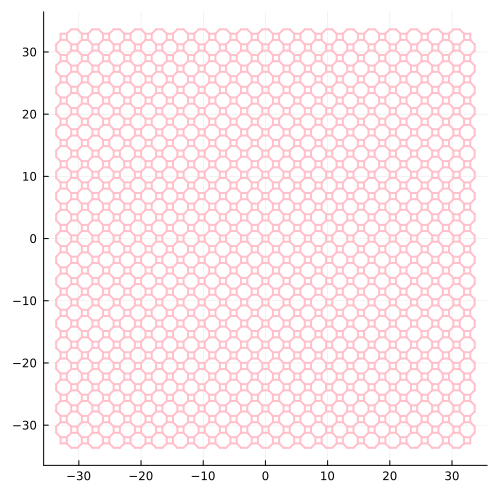

  2.524563 seconds (689.41 k allocations: 40.838 MiB, 1.14% compilation time)


In [18]:
# # Plot lattice and vertical/horizontal configuration

p = plot_generate(500)
@time plot_edges(p,so_lat_rect_full)
# config_vert = get_vert_col_state(so_lat_rect_spin, so_lat_rect)
# config_hori = get_hori_col_state(so_lat_rect_spin, so_lat_rect)
# plot_config(p, config_hori,spin_to_G, so_lat_rect)
# plot!(xticks=false, yticks=false, framestyle=:none)

display(p)

In [19]:
function mc_move(config::Vector{Bool}, plaq_oct_spin::Matrix{Int64},plaq_sq_spin::Matrix{Int64},noct::Int64, nsq::Int64 )
    # Returns true if move is not done
    # returns false if a move is done
    if rand(Bool)
        return plaq_oct_move(config,plaq_oct_spin, noct )
    else
        return plaq_sq_move(config,plaq_sq_spin, nsq )
    end
    return nothing
end

function randomize(initial_config::Vector{Bool}, plaq_oct_spin::Matrix{Int64},plaq_sq_spin::Matrix{Int64}, nsample::Int64)
    Random.seed!(1234)
    noct = size(plaq_oct_spin)[2]
    nsq = size(plaq_sq_spin)[2]
    for i in 1:nsample
        while !mc_move(initial_config, plaq_oct_spin, plaq_sq_spin, noct, nsq)
        end
    end
    return initial_config
end


randomize (generic function with 1 method)

In [20]:
config_vert = get_vert_col_state(so_lat_rect_spin_full, so_lat_rect_full)
config_hori = get_hori_col_state(so_lat_rect_spin_full, so_lat_rect_full)
rand_config = randomize(config_vert, so_lat_rect_spin_full.oct_plaq, so_lat_rect_spin_full.sq_plaq, 1000)
;

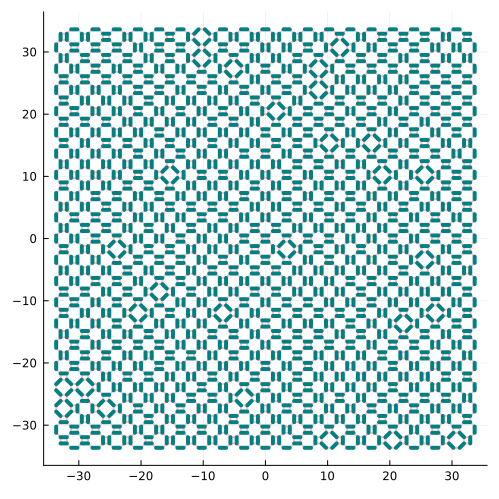

  2.299365 seconds (670.29 k allocations: 39.873 MiB, 8.81% gc time)


In [21]:
# # Plot lattice and vertical/horizontal configuration

p = plot_generate(500)
@time plot_edges(p,so_lat_rect_full)
# config_vert = get_vert_col_state(so_lat_rect_spin, so_lat_rect)
# config_hori = get_hori_col_state(so_lat_rect_spin, so_lat_rect)
plot_config(p, rand_config,spin_to_G, so_lat_rect)
# plot!(xticks=false, yticks=false, framestyle=:none)

display(p)

In [22]:
function plot_config(p, config,spin_to_G, so_lat, annotate = false)
    for i in 1:length(config)
        if config[i] == true
            a, b = spin_to_G[i]
            p1, p2 = so_lat.pts[a], so_lat.pts[b] 
            x, y = real.([p1,p2]) ,  imag.([p1, p2])
            plot!(p,x, y , linecolor="teal", linewidth=2)
        end
    end
    if annotate
        scatter!(p, real(pts), imag(pts), mc=:blue, markerstrokewidth=0, series_annotations = text.(1:npts))
    end
    return p
end

plot_config (generic function with 2 methods)

In [23]:
function bipartite_sublattices(adj::AbstractMatrix{Bool})
    n = size(adj, 1)
    color = fill(-1, n)  # -1: unvisited, 0: set A, 1: set B

    for start in 1:n
        if color[start] == -1
            queue = [start]
            color[start] = 0

            while !isempty(queue)
                u = popfirst!(queue)
                for v in 1:n
                    if adj[u, v]
                        if color[v] == -1
                            color[v] = 1 - color[u]
                            push!(queue, v)
                        elseif color[v] == color[u]
                            error("Graph is not bipartite")
                        end
                    end
                end
            end
        end
    end

    set_A = findall(x -> x == 0, color)
    set_B = findall(x -> x == 1, color)
    return set_A, set_B
end

bipartite_sublattices (generic function with 1 method)

In [24]:
A, B = bipartite_sublattices(Matrix{Bool}(so_lat_full.adj))
println("Set A: ", A)
println("Set B: ", B)
sublattice = fill("", length(so_lat.pts))
for a in A
    sublattice[a] = "A"
end
for b in B
    sublattice[b] = "B"
end
if "" in sublattice
    error("Not all sites are assigned to a sublattice")
end

UndefVarError: UndefVarError: `so_lat_full` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [25]:
function plot_config_4color2(p, config,spin_to_G, so_lat, A, B, sublattice)
    cols = ["red", "blue", "green", "orange", "gray"]
    cols = ["red", "blue", "green", "orange", "gold","purple","orangered","turquoise"]
    # cols = ["red", "blue", "green", "orange", "khaki","plum","salmon","darkturquoise"]
    cols = ["green","orange","red","blue","plum","khaki","darkturquoise","salmon"]
    blk = "grey0"
    cols = ["limegreen","darkgoldenrod1","lightsalmon1","steelblue1",blk, blk, blk, blk]
    # Fucntion to assign colors based on the orientation
    # cols[1] for vertical dimers of the form AB
    # cols[2] for vertical dimers of the form BA
    # cols[3] for horizontal dimers of the form AB
    # cols[4] for horizontal dimers of the form BA

    for i in 1:length(config)
        if config[i] == true
            a, b = spin_to_G[i]
            p1, p2 = so_lat.pts[a], so_lat.pts[b] 
            color = "black" # default color
            # Determine the orientation of the dimer
            if abs( real(p1-p2) ) < 1e-5
                # vertical dimers
                top, bottom = a, b
                if imag(p1) < imag(p2)
                    top, bottom = b, a
                end
                # Check the sublattice of the dimer
                if sublattice[top] == "A" && sublattice[bottom] == "B"
                    color = cols[1]
                elseif sublattice[top] == "B" && sublattice[bottom] == "A"
                    color = cols[3]
                end
            
            elseif abs( imag(p1-p2) ) < 1e-5

                left, right = a, b
                if real(p1) > real(p2)
                    left, right = b, a
                end
                if sublattice[left] == "A" && sublattice[right] == "B"
                    color = cols[4]
                elseif sublattice[left] == "B" && sublattice[right] == "A"
                    color = cols[2]
                end
            else
                # diagonal dimers
                # Check the sublattice of the dimer
                indA, indB = 0, 0
                if sublattice[a] == "A" && sublattice[b] == "B"
                    indA, indB = a, b
                elseif sublattice[a] == "B" && sublattice[b] == "A"
                    indA, indB = b, a
                else
                    error("Dimer does not belong to the bipartite lattice")
                end
                pA, pB = so_lat.pts[indA], so_lat.pts[indB]
                angle = (imag(pA-pB) * real(pA-pB) > 0) ? "45" : "135"
                if angle == "45" 
                    if real(pA) < real(pB) 
                        color = cols[5]
                    elseif real(pA) > real(pB)
                            color = cols[6]
                    end
                elseif angle == "135"
                    if real(pA) < real(pB)
                        color = cols[7]
                    elseif real(pA) > real(pB)
                        color = cols[8]
                    end
                end
            end
            x, y = real.([p1,p2]) ,  imag.([p1, p2])
            plot!(p,x, y , linecolor=color, linewidth=4.5)
        end
    end
    return p
end

plot_config_4color2 (generic function with 1 method)

In [ ]:
p = plot_generate(800)
# plot_graph(p,so_lattice, "pink",  2, :green)
@time plot_edges(p,so_lat_full, "pink", 1.5)
# plot_edges(p,so_lat_spin,"green")
@time plot_config_4color2(p, config,spin_to_G, so_lat, A, B, sublattice)
# plot!(xticks=false, yticks=false, framestyle=:none)
# display(p)
;

  2.470216 seconds (749.90 k allocations: 43.774 MiB, 6.85% compilation time)


UndefVarError: UndefVarError: `config` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [101]:
η = maximum(real.(so_lat_spin.pts)) / 2 - 0.5 / 2
println("CHECK THIS ADDITIONAL 0.5 / 2")
x_list = y_list = range(-2η, stop=2η, length=700) # -2*η:0.01:2*η

Z = [ 400 * (x/η)^8 + 400 * (y/η)^8 + 3400 * (x/η)^2 * (y/η)^6 + 3400 * (y/η)^2 * (x/η)^6 + 8025 * (x/η)^4 * (y/η)^4 + 1000 * (x/η)^6 + 1000 * (y/η)^6 - 17250 * (x/η)^4 * (y/η)^2 - 17250 * (x/η)^2 * (y/η)^4 - 1431 * (x/η)^4 - 1431 * (y/η)^4 + 25812 * (x/η)^2 * (y/η)^2 - 3402 * (x/η)^2 - 3402 * (y/η)^2 + 729 for x in x_list, y in y_list]

lc = :purple
contour!(p,x_list, y_list, Z, levels=[0], aspect_ratio=:equal, linecolor=lc, linewidth=3)
Z_lat = [abs(x) + abs(y) - 2η for x in x_list, y in y_list]
contour!(p,x_list, y_list, Z_lat, levels=[0], aspect_ratio=:equal, linecolor=lc, linewidth=3)
plot!(grid=false, ticks=false, framestyle=:none)
;

CHECK THIS ADDITIONAL 0.5 / 2


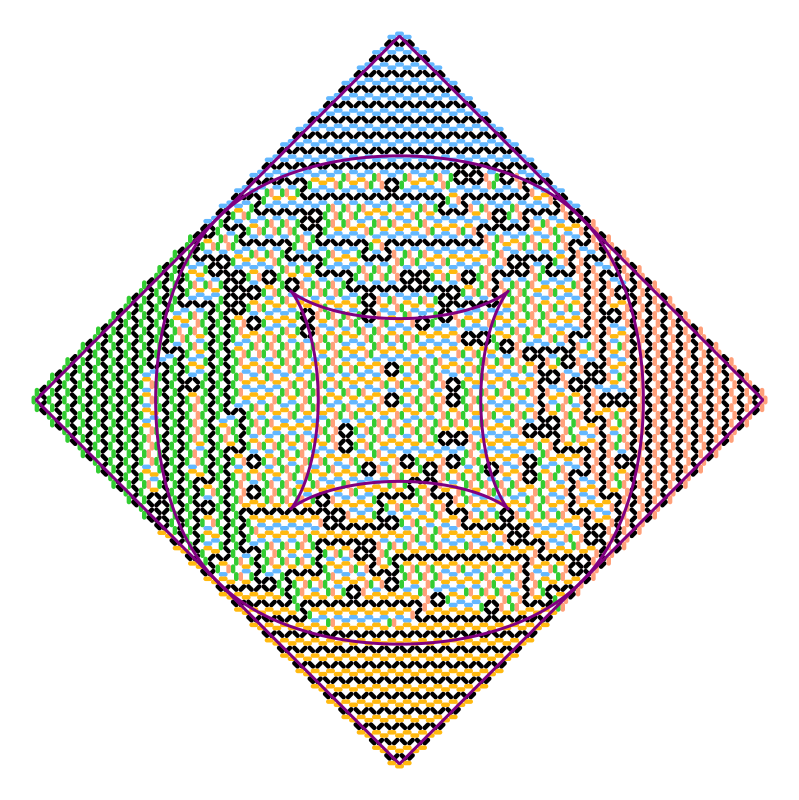

In [ ]:
# savefig(p, "./images/paper_images/so-random-config.pdf")
# savefig(p, "./images/paper_images/cluster-so-random-config.svg")
# savefig(p, "./images/paper_images/cluster-so-random-config.pdf")
# savefig(p, "./images/paper_images/cluster-so-random-config.svg")
display(p)

In [98]:
p = plot_generate(900)
plot_edges(p,so_lat_full, "pink", 1.5)
plot_config_4color(p, config,spin_to_G, so_lat, A, B, sublattice)
# plot!(xticks=false, yticks=false, framestyle=:none)
display(p)

UndefVarError: UndefVarError: `plot_config_4color` not defined in `Main`
Suggestion: check for spelling errors or missing imports.